# Importing Libraries

In [4]:
import pickle
import numpy as np
import pandas as pd
from PIL import Image
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import os, re, sys, random, shutil, cv2

# import segmentation_models as sm
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from keras import backend as K
from keras.models import Model
from keras.optimizers import Adam, Nadam
from keras import applications, optimizers
from keras.applications import InceptionResNetV2
from keras.applications import resnet

from keras.preprocessing.image import ImageDataGenerator
from keras.utils import load_img, img_to_array, to_categorical
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler
from keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, Conv2DTranspose, concatenate, ZeroPadding2D, Dropout

# Data Augmentation

In [6]:
images_dir = './data/images/'
masks_dir = './data/masks/'

In [8]:
file_names = np.sort(os.listdir(images_dir))
file_names = np.char.split(file_names, '.')
filenames = np.array([])
for i in range(len(file_names)):
    filenames = np.append(filenames, file_names[i][0])

In [10]:
transform_1 = A.Compose([
    A.HorizontalFlip(p=1.0),
    A.VerticalFlip(p=1.0),
    A.Rotate(limit=[60, 300], p=1.0, interpolation=cv2.INTER_NEAREST),
    A.OneOf([
        A.GridDistortion(distort_limit= 0.2,p=0.5),
        A.OpticalDistortion(distort_limit=1, shift_limit=0.5, interpolation=cv2.INTER_NEAREST, p=0.5),
    ], p=1.0),
], p=1.0)

transform_2 = A.Compose([
   A.RandomBrightnessContrast(brightness_limit=[-0.05, 0.20], contrast_limit=0.2, p=1.0),
    A.OneOf([
        A.CLAHE (clip_limit=1.5, tile_grid_size=(8, 8), p=0.5),
    ], p=1.0),
], p=1.0)

In [13]:
for i in range(8):
    print(f"loop {i+1} ...")
    for file in filenames:
        img = cv2.imread(images_dir+file+'.png')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(masks_dir+'mask'+file[5:]+'.png')
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        transformed = transform_1(image=img, mask=mask)
        transformed_image = transformed['image']
        transformed_mask = transformed['mask']

        cv2.imwrite('./data/images/aug_image{}_'.format(str(i+1))+file[5:]+'.png', cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
        cv2.imwrite('./data/masks/aug_mask{}_'.format(str(i+1))+file[5:]+'.png', cv2.cvtColor(transformed_mask, cv2.COLOR_BGR2RGB))

for i in range(8, 10):
    print(f"loop {i+1} ...")
    for file in filenames:
        img = cv2.imread(images_dir+file+'.png')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(masks_dir+'mask'+file[5:]+'.png')
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        transformed = transform_2(image=img)
        transformed_image = transformed['image']
        transformed_mask = mask

        cv2.imwrite('./data/images/aug_image{}_'.format(str(i+1))+file[5:]+'.png', cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
        cv2.imwrite('./data/masks/aug_mask{}_'.format(str(i+1))+file[5:]+'.png', cv2.cvtColor(transformed_mask, cv2.COLOR_BGR2RGB))

loop 1 ...
loop 2 ...
loop 3 ...
loop 4 ...
loop 5 ...
loop 6 ...
loop 7 ...
loop 8 ...
loop 9 ...
loop 10 ...


# Splitting data

In [50]:
train_dir = './data/train/'
valid_dir = './data/valid/'
test_dir = './data/test/'

In [33]:
image_names = os.listdir(images_dir)

rs = np.random.RandomState(42)

rs.shuffle(image_names)

mask_names = [x.replace("image", "mask") for x in image_names]

print(len(image_names))
print(len(mask_names))

1320
1320


In [60]:
print("Train size :", round(1320 * 0.7), "~ 70%")
print("Validation size :", round(1320 * 0.15), "~ 15%")
print("Test size :", round(1320 * 0.15), "~ 15%")

Train size : 924 ~ 70%
Validation size : 198 ~ 15%
Test size : 198 ~ 15%


In [51]:
for i, name in enumerate(zip(image_names, mask_names)):
    img_name = name[0]
    msk_name = name[1]
    
    if(i < 924):
        shutil.move(images_dir + img_name, train_dir + "images/" + img_name)
        shutil.move(masks_dir + msk_name, train_dir + "masks/" + msk_name)
    elif(i < (924 + 198)):
        shutil.move(images_dir + img_name, valid_dir + "images/" + img_name)
        shutil.move(masks_dir + msk_name, valid_dir + "masks/" + msk_name)
    else:
        shutil.move(images_dir + img_name, test_dir + "images/" + img_name)
        shutil.move(masks_dir + msk_name, test_dir + "masks/" + msk_name)

# Importing & Preprocessing Data

In [ ]:
train_dir = '../input/burned-area-dataset/train/'
valid_dir = '../input/burned-area-dataset/valid/'
test_dir = '../input/burned-area-dataset/test/'

In [ ]:
def mask_to_onehot(mask):
    mask_segment = np.zeros(mask.shape, dtype=np.int8)
    mask_segment[mask == 0] = 0
    mask_segment[mask != 0] = 1
    mask_segment = mask_segment[:,:,0]
    mask_segment = to_categorical(mask_segment, num_classes=2)
    return mask_segment

def onehot_to_mask(onehot):
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    output[single_layer == 0] = (0, 0, 0)
    output[single_layer == 1] = (128, 128, 128)
    return np.uint8(output)

def flatten_mask(mask):
    mask[mask == 0] = 0
    mask[mask != 0] = 128
    return mask

In [ ]:
train_images_datagen = ImageDataGenerator(dtype='float32', rescale= 1./255.)
train_masks_datagen = ImageDataGenerator()

valid_images_datagen = ImageDataGenerator(dtype='float32', rescale= 1./255.)
valid_masks_datagen = ImageDataGenerator()

test_images_datagen = ImageDataGenerator(dtype='float32', rescale= 1./255.)
test_masks_datagen = ImageDataGenerator()

In [ ]:
def TrainGenerator(train_images_dir, train_masks_dir, seed = 42, batch_size = 32, target_size = (512, 512)):

    train_image_generator = train_images_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    while True:
        X1i = train_image_generator.next()
        X2i = train_mask_generator.next()
        
        #One hot encoding masks
        mask_encoded = [mask_to_onehot(X2i[0][x,:,:,:]) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValidGenerator(valid_images_dir, valid_masks_dir, seed = 42, batch_size = 32, target_size = (512, 512)):

    valid_image_generator = valid_images_datagen.flow_from_directory(
    valid_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    valid_mask_generator = valid_masks_datagen.flow_from_directory(
    valid_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = valid_image_generator.next()
        X2i = valid_mask_generator.next()
        
        #One hot encoding masks
        mask_encoded = [mask_to_onehot(X2i[0][x,:,:,:]) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def TestGenerator(test_images_dir, test_masks_dir, seed = 42, batch_size = 32, target_size = (512, 512)):

    test_image_generator = test_images_datagen.flow_from_directory(
    test_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    test_mask_generator = test_masks_datagen.flow_from_directory(
    test_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = test_image_generator.next()
        X2i = test_mask_generator.next()
        
        #One hot encoding masks
        mask_encoded = [mask_to_onehot(X2i[0][x,:,:,:]) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

# Building the model

In [28]:
def multi_segnet_model(n_classes=2, image_height=512, image_width=512, image_channels=3):

    inputs = Input((image_height, image_width, image_channels))

    source_input = inputs

    c1 = Conv2D(16, (3,3), padding="same")(source_input)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    c1 = Conv2D(16, (3,3), padding="same")(c1)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2,2))(c1)
    
    c2 = Conv2D(32, (3,3), padding="same")(p1)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    c2 = Conv2D(32, (3,3), padding="same")(c2)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2,2))(c2)
    
    c3 = Conv2D(64, (3,3), padding="same")(p2)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding="same")(c3)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding="same")(c3)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2,2))(c3)
    
    c4 = Conv2D(128, (3,3), padding="same")(p3)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding="same")(c4)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding="same")(c4)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2,2))(c4)
    
    c5 = Conv2D(256, (3,3), padding="same")(p4)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding="same")(c5)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding="same")(c5)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    p5 = MaxPooling2D((2,2))(c5)
    
    
    
    u6 = UpSampling2D((2,2))(p5)
    c6 = Conv2D(256, (3,3), padding="same")(u6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Conv2D(256, (3,3), padding="same")(c6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Conv2D(256, (3,3), padding="same")(c6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    
    u7 = UpSampling2D((2,2))(c6)
    c7 = Conv2D(128, (3,3), padding="same")(u7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Conv2D(128, (3,3), padding="same")(c7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Conv2D(128, (3,3), padding="same")(c7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    
    u8 = UpSampling2D((2,2))(c7)
    c8 = Conv2D(64, (3,3), padding="same")(u8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Conv2D(64, (3,3), padding="same")(c8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Conv2D(64, (3,3), padding="same")(c8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    
    u9 = UpSampling2D((2,2))(c8)
    c9 = Conv2D(32, (3,3), padding="same")(u9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)
    c9 = Conv2D(32, (3,3), padding="same")(c9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)
    
    u10 = UpSampling2D((2,2))(c9)
    c10 = Conv2D(16, (3,3), padding="same")(u10)
    c10 = BatchNormalization()(c10)
    c10 = Activation('relu')(c10)
    c10 = Conv2D(16, (3,3), padding="same")(c10)
    c10 = BatchNormalization()(c10)
    c10 = Activation('relu')(c10)
    
    outputs = Conv2D(n_classes, (1,1), padding="valid")(c10)
    outputs = Activation('softmax')(outputs)

    model = Model(inputs=[inputs], outputs=[outputs])
    
    return model

In [33]:
segnet_model = multi_segnet_model()

# Training our model

In [ ]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 60)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = 'burned-area-2classes-SegNet.h5',
    save_best_only = True,
    monitor = 'val_loss',
    mode = 'auto', 
    verbose = 1
)

earlystop = EarlyStopping(
    monitor = 'val_loss', 
    min_delta = 0.001, 
    patience = 10,
    mode = 'auto', 
    verbose = 1,
    restore_best_weights = True
)

csvlogger = CSVLogger(
    filename= "model_training.csv",
    separator = ",",
    append = False
)

callbacks = [checkpoint, earlystop, csvlogger, lr_scheduler]


def iou_coef(y_true, y_pred):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)
    intersection = K.sum(y_true_flatten * y_pred_flatten)
    final_coef_value = (intersection + 1.0) / (K.sum(y_true_flatten) + K.sum(y_pred_flatten) - intersection + 1.0)
    return final_coef_value

In [ ]:
K.clear_session()

segnet_model.compile(optimizer=Adam(learning_rate = 0.0001), loss='categorical_crossentropy', metrics=["accuracy", iou_coef])

segnet_history = segnet_model.fit(
    TrainGenerator(train_images_dir = os.path.join(train_dir, "images"), train_masks_dir = os.path.join(train_dir, "masks")), 
    batch_size=32,
    steps_per_epoch=29,
    validation_data = ValidGenerator(valid_images_dir = os.path.join(valid_dir, "images"), valid_masks_dir = os.path.join(valid_dir, "masks")), 
    validation_steps = 6,
    epochs = 100,
    callbacks=callbacks,
    verbose=1,
    shuffle=False
)

Found 924 images belonging to 1 classes.
Found 924 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/100
29/29 [==============================] - ETA: 0s - loss: 0.3867 - accuracy: 0.8572 - iou_coef: 0.5802Found 198 images belonging to 1 classes.
Found 198 images belonging to 1 classes.

Epoch 1: val_loss improved from inf to 0.66087, saving model to burned-area-2classes-SegNet.h5
29/29 [==============================] - 128s 3s/step - loss: 0.3867 - accuracy: 0.8572 - iou_coef: 0.5802 - val_loss: 0.6609 - val_accuracy: 0.8601 - val_iou_coef: 0.3483 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.623506263980886e-05.
Epoch 2/100
29/29 [==============================] - ETA: 0s - loss: 0.2414 - accuracy: 0.9193 - iou_coef: 0.7154
Epoch 2: val_loss improved from 0.66087 to 0.55948, saving model to burned-area-2classes-SegNet.h5
29/29 [==============================] - 97s 3s/step - loss: 0.2414 - accuracy: 

# Results

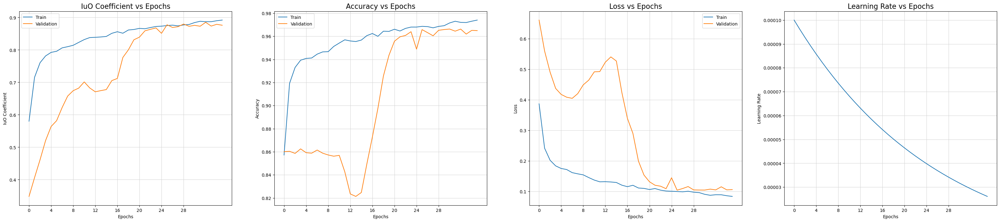

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(40, 8))
ax = ax.ravel()
metrics = ['IuO Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['iou_coef', 'accuracy', 'loss', 'lr']): 
    if met != 'lr':
        ax[i].plot(segnet_history.history[met])
        ax[i].plot(segnet_history.history['val_' + met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,32,4))
        ax[i].legend(['Train', 'Validation'])
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
    else:
        ax[i].plot(segnet_history.history[met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,32,4))
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")

# Predictions & Comparing

In [ ]:
testing_gen = TestGenerator(test_images_dir = os.path.join(test_dir, "images"),
                            test_masks_dir = os.path.join(test_dir, "masks"),
                            batch_size = 16)

segnet_model.evaluate(testing_gen,
                      batch_size = 16,
                      steps = 12)

Found 198 images belonging to 1 classes.
Found 198 images belonging to 1 classes.
12/12 [==============================] - 18s 2s/step - loss: 0.1089 - accuracy: 0.9642 - iou_coef: 0.8753


[0.10891241580247879, 0.9641525149345398, 0.8753044009208679]

1/1 [==============================] - 1s 502ms/step


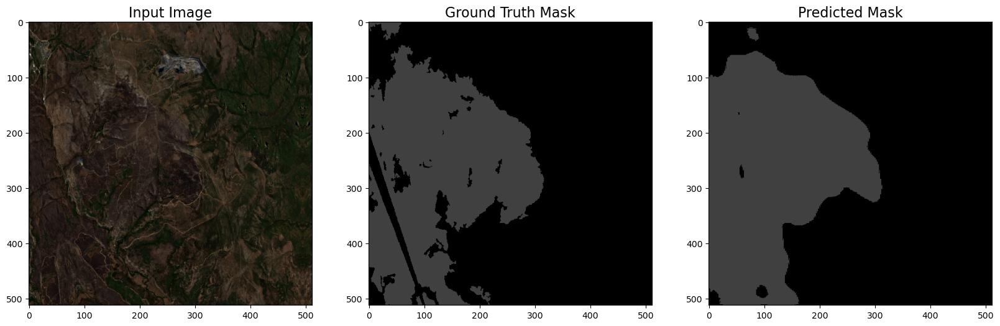

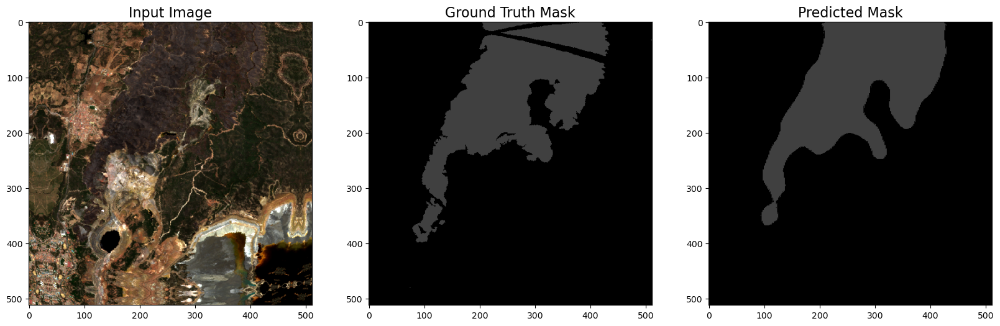

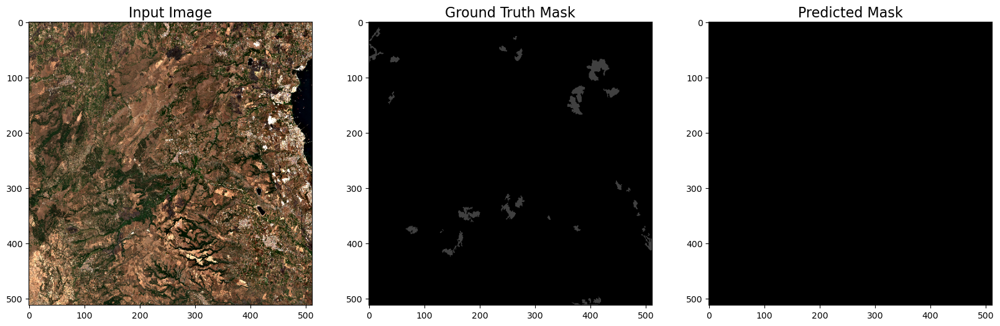

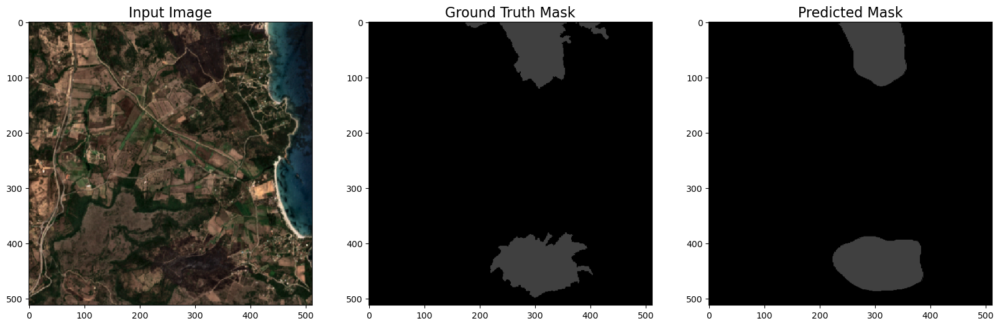

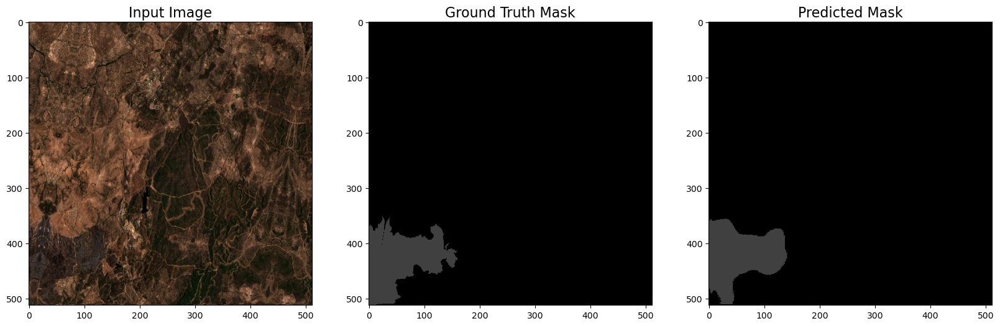

...

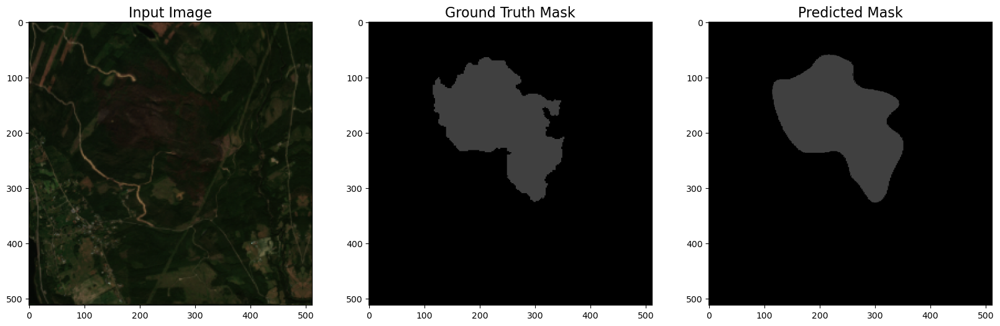

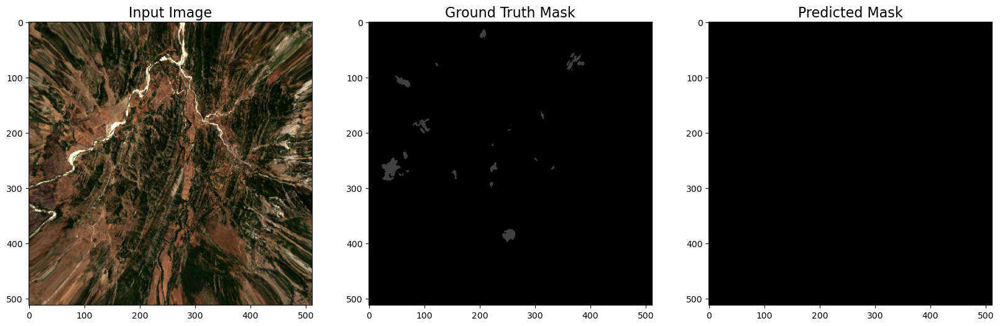

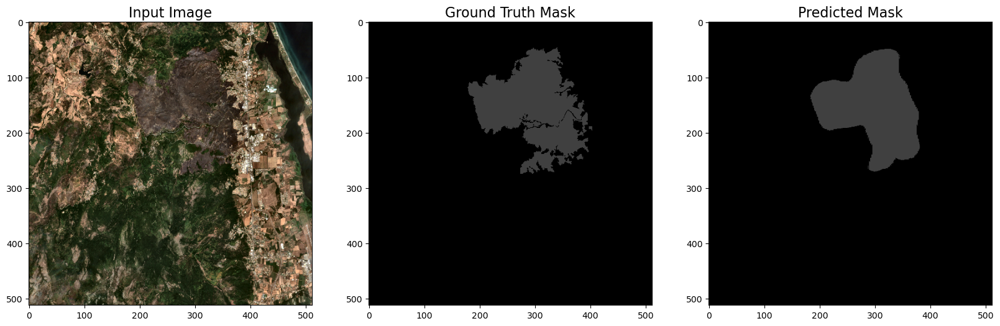

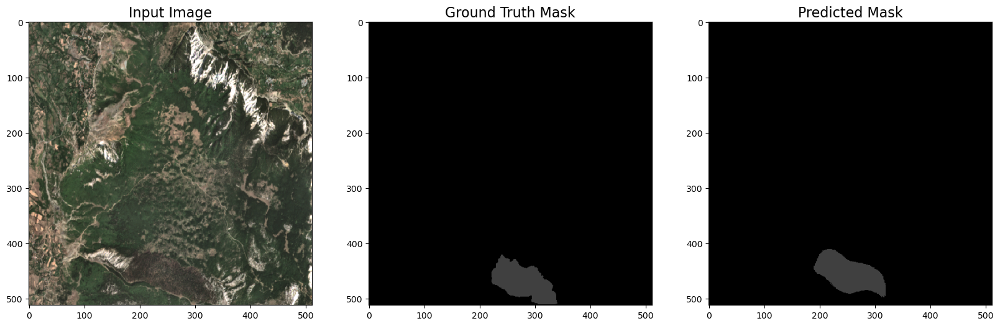

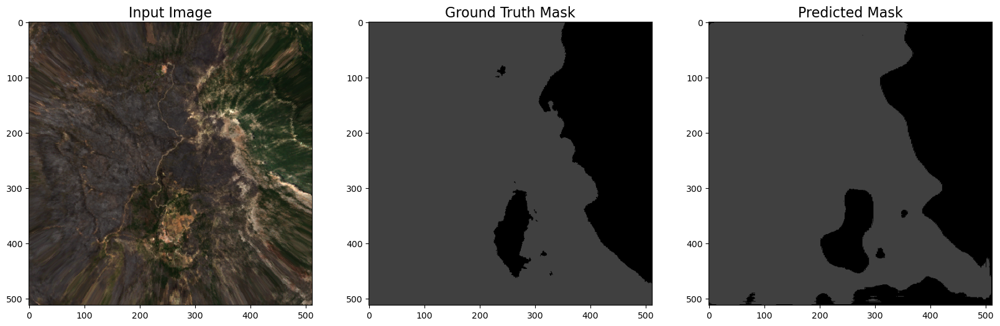

In [ ]:
batch_img,batch_mask = next(testing_gen)
pred_all = segnet_model.predict(batch_img)
np.shape(pred_all)

for j in range(0,np.shape(pred_all)[0]):
    fig = plt.figure(figsize=(20,8))

    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[j])
    ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax1.grid(False)

    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax2.imshow(onehot_to_mask(batch_mask[j]))
    ax2.grid(False)

    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax3.imshow(onehot_to_mask(pred_all[j]))
    ax3.grid(False)

    plt.show()

# Predict unseen image

1/1 [==============================] - 2s 2s/step


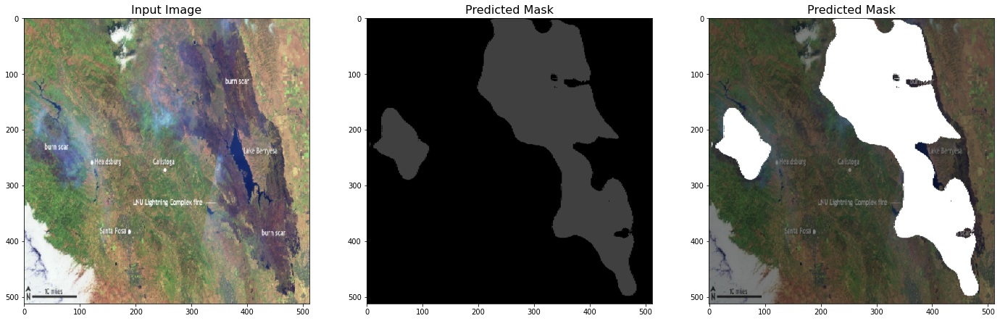

In [ ]:
tmp_img = img_to_array(load_img("image3.png", target_size = (512,512)))
tmp_img = tf.expand_dims(tmp_img, 0) / 255.0

prediction = segnet_model.predict(tmp_img)
tmp_mask = onehot_to_mask(prediction[0])

fig = plt.figure(figsize=(24,8))

ax1 = fig.add_subplot(1,3,1)
ax1.imshow(tmp_img[0])
ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax1.grid(False)

ax2 = fig.add_subplot(1,3,2)
ax2.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax2.imshow(tmp_mask)
ax2.grid(False)

dst = cv2.addWeighted(np.array(tmp_img[0]), 0.5, tmp_mask, 0.5, 0, dtype = cv2.CV_32F)
ax3 = fig.add_subplot(1,3,3)
ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax3.imshow(dst)
ax3.grid(False)